In [2]:
import numpy as np
import pickle
import random
import time
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import PIL
from PIL import Image
from sklearn.neighbors import NearestNeighbors

import glob
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [ ]:
%cd ..

In [34]:
filenames = pickle.load(open('features/filenames-caltech101.pickle', 'rb'))
feature_list = pickle.load(open('features/features-caltech101-resnet.pickle','rb'))
class_ids = pickle.load(open('features/class_ids-caltech101.pickle', 'rb'))

In [23]:
filenames = [filename[1:] for filename in filenames] # remove first / to turn absolute from colab to relative

In [5]:
num_images = len(filenames)
num_features_per_image = len(feature_list[0])
print("Number of images = ", num_images)
print("Number of features per image = ", num_features_per_image)


Number of images =  9144
Number of features per image =  2048
time: 807 µs (started: 2023-02-21 23:29:09 +08:00)


# Sklearn NearestNeighbors Brute Force

In [6]:
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='brute',
                             metric='euclidean').fit(feature_list)

time: 10.8 ms (started: 2023-02-21 23:29:09 +08:00)


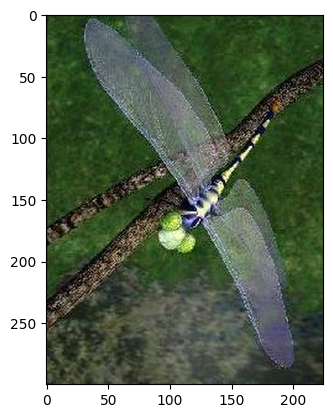

time: 596 ms (started: 2023-02-21 23:29:09 +08:00)


In [7]:
random_index = 5000
distances, indices = neighbors.kneighbors([feature_list[random_index]])
plt.imshow(mpimg.imread(filenames[random_index]), interpolation='lanczos')

In [8]:
distances, indices

(array([[  0.        , 233.67580708, 242.47375825, 247.35982457,
         249.23157686]]),
 array([[5000, 5048, 5046, 6856, 6862]]))

time: 2.62 ms (started: 2023-02-21 23:29:10 +08:00)


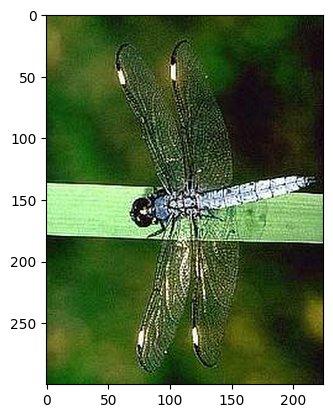

time: 447 ms (started: 2023-02-21 23:29:10 +08:00)


In [9]:
plt.imshow(mpimg.imread(filenames[indices[0][1]]), interpolation='lanczos')

In [10]:
# Helper function to get the classname and filename
def classname_filename(str):
    return str.split('/')[-2] + '/' + str.split('/')[-1]


# Helper functions to plot the nearest images given a query image
def plot_images(filenames, distances):
    images = []
    for filename in filenames:
        images.append(mpimg.imread(filename))
    plt.figure(figsize=(20, 10))
    columns = 4
    for i, image in enumerate(images):
        ax = plt.subplot(len(images) // columns + 1, columns, i + 1)
        if i == 0:
            ax.set_title("Query Image\n" + classname_filename(filenames[i]), color='r')
        else:
            ax.set_title("Similar Image\n" + classname_filename(filenames[i]) +
                         "\nDistance: " +
                         str(float("{0:.2f}".format(distances[i]))))
        plt.axis('off')
        plt.imshow(image)

time: 1.81 ms (started: 2023-02-21 23:29:10 +08:00)


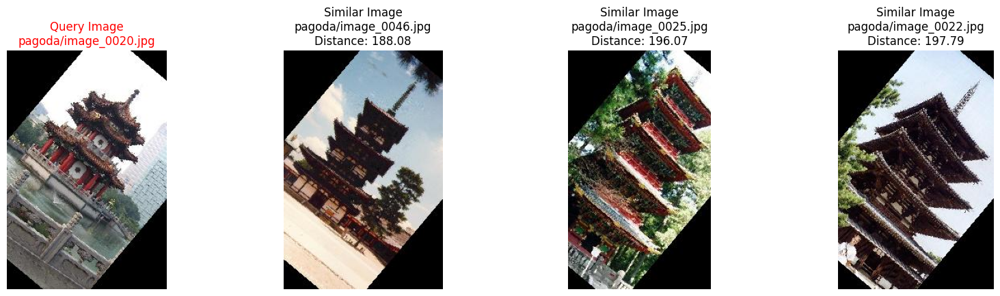

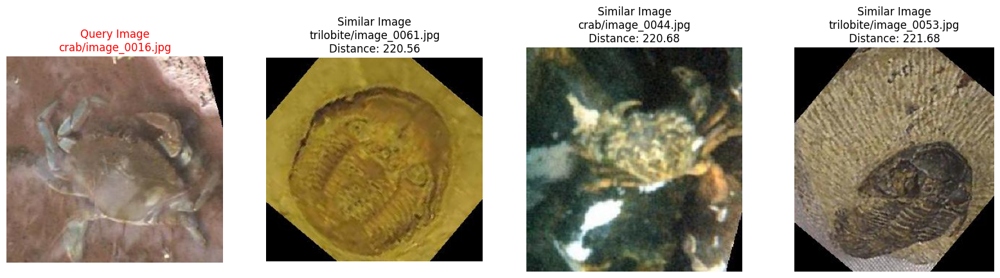

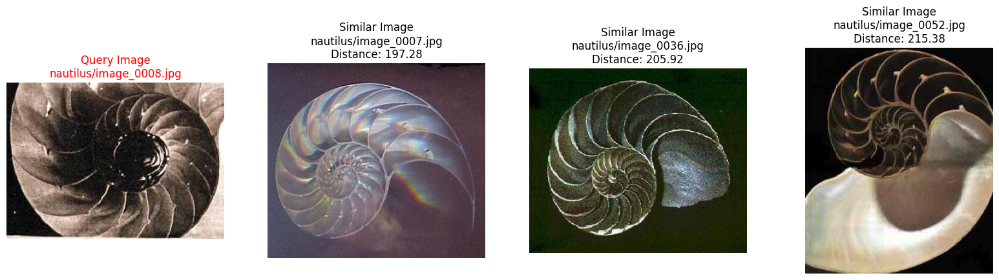

time: 2.76 s (started: 2023-02-21 23:29:10 +08:00)


In [11]:
# Interesting finds 
for _ in range(3):
    random_image_index = random.randint(0, num_images)
    distances, indices = neighbors.kneighbors([feature_list[random_image_index]])
    similar_image_paths = [filenames[random_image_index]] + [filenames[indices[0][i]] for i in range(1, 4)]   # Top 3 similar images, excluding itself at index 0
    plot_images(similar_image_paths, distances[0])

In [12]:
neighbors = NearestNeighbors(n_neighbors=len(feature_list),
                             algorithm='brute',
                             metric='euclidean').fit(feature_list)
distances, indices = neighbors.kneighbors(feature_list)

# Calculating some stats
print("Median distance between all photos: ", np.median(distances))
print("Max distance between all photos: ", np.max(distances))
print("Median distance among most similar photos: ",
      np.median(distances[:, 2]))

Median distance between all photos:  304.50760715046187
Max distance between all photos:  483.81932642774825
Median distance among most similar photos:  197.37283287005266
time: 10.2 s (started: 2023-02-21 23:29:13 +08:00)


In [26]:
start, end = 6000,7000
selected_features = feature_list[start:end]
selected_class_ids = class_ids[start:end]
selected_filenames = filenames[start:end]

# TSNE to visualize clusters
- Argument against TSNE (Cloud watching): https://stats.stackexchange.com/questions/263539/clustering-on-the-output-of-t-sne/264647#264647

In [27]:
from sklearn.manifold import TSNE

# You can play with these values and see how the results change
n_components = 2
verbose = 1
perplexity = 30
n_iter = 1000
metric = 'euclidean'

time_start = time.time()
tsne_results = TSNE(n_components=n_components,
                    verbose=verbose,
                    perplexity=perplexity,
                    n_iter=n_iter,
                    random_state=1,
                    metric=metric).fit_transform(selected_features)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time() - time_start))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.002s...
[t-SNE] Computed neighbors for 1000 samples in 0.308s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 67.461127
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.199841
[t-SNE] KL divergence after 1000 iterations: 0.660255
t-SNE done! Time elapsed: 2.943073034286499 seconds


/var/folders/x1/jvkctbr51vvgvwwpw7m2l_fm0000gn/T/ipykernel_45304/1286269066.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('coolwarm')


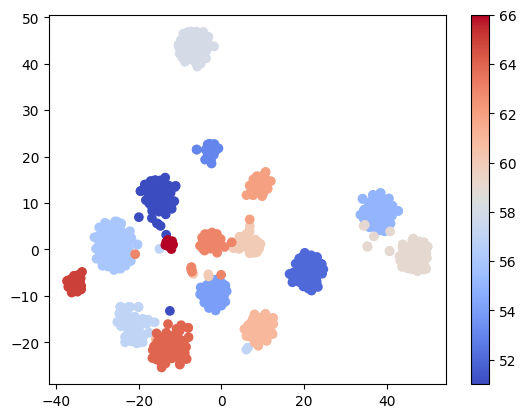

In [28]:
color_map = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:, 0],
                           tsne_results[:, 1],
                           c=selected_class_ids,
                           cmap=color_map)
plt.colorbar(scatter_plot)
plt.show()

In [29]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data


def plot_images_in_2d(x, y, image_paths, axis=None, zoom=1):
    if axis is None:
        axis = plt.gca()
    x, y = np.atleast_1d(x, y)
    for x0, y0, image_path in zip(x, y, image_paths):
        image = Image.open(image_path)
        image.thumbnail((100, 100), Image.ANTIALIAS)
        img = OffsetImage(image, zoom=zoom)
        anno_box = AnnotationBbox(img, (x0, y0),
                                  xycoords='data',
                                  frameon=False)
        axis.add_artist(anno_box)
    axis.update_datalim(np.column_stack([x, y]))
    axis.autoscale()

In [30]:
def show_tsne(x, y, selected_filenames):
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    plot_images_in_2d(x, y, selected_filenames, zoom=0.3, axis=axis)
    plt.show()

## TSNE without PCA

/var/folders/x1/jvkctbr51vvgvwwpw7m2l_fm0000gn/T/ipykernel_45304/3270203280.py:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image.thumbnail((100, 100), Image.ANTIALIAS)


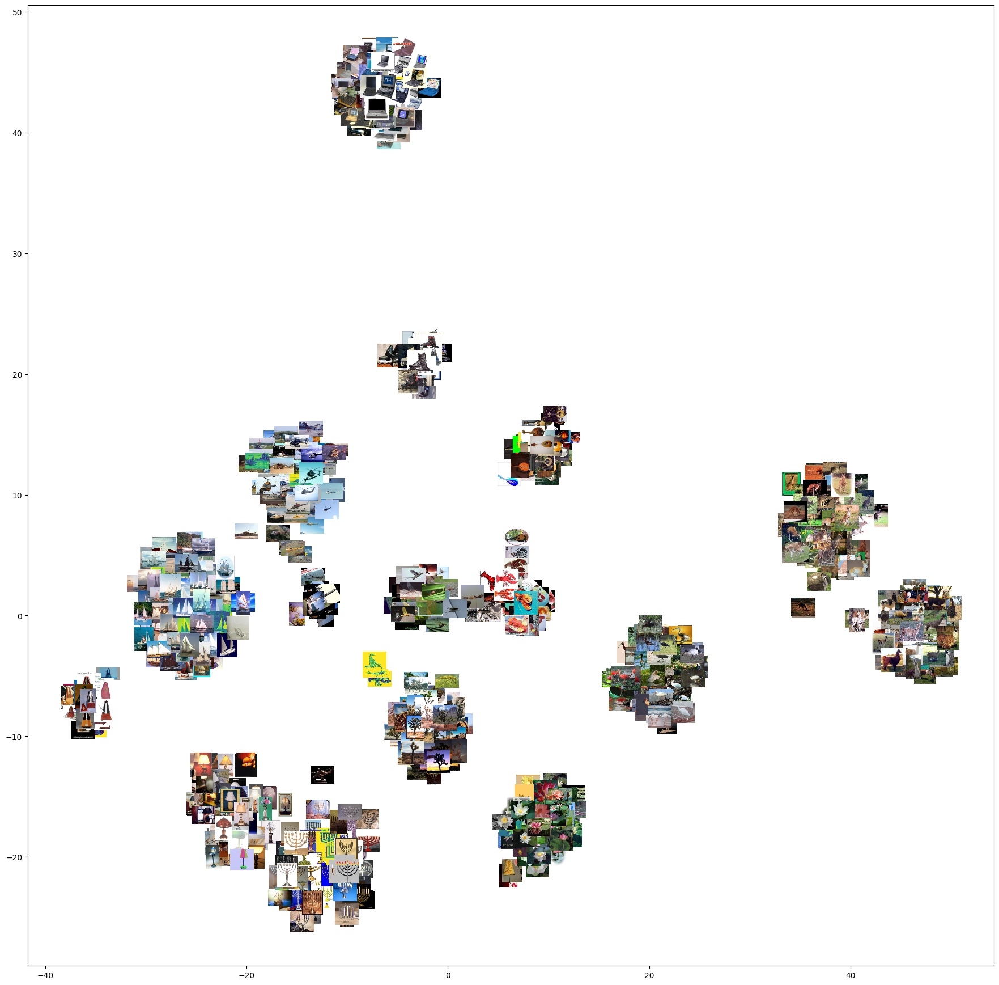

In [35]:
show_tsne(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)

In [19]:
# To spread out overlapped images from show_tsne() by sampling 
def tsne_to_grid_plotter_manual(x, y, selected_filenames):
    S = 2000
    s = 100
    x = (x - min(x)) / (max(x) - min(x))
    y = (y - min(y)) / (max(y) - min(y))
    x_values = []
    y_values = []
    filename_plot = []
    x_y_dict = {}
    for i, image_path in enumerate(selected_filenames):
        a = np.ceil(x[i] * (S - s))
        b = np.ceil(y[i] * (S - s))
        a = int(a - np.mod(a, s))
        b = int(b - np.mod(b, s))
        if str(a) + "|" + str(b) in x_y_dict:
            continue
        x_y_dict[str(a) + "|" + str(b)] = 1
        x_values.append(a)
        y_values.append(b)
        filename_plot.append(image_path)
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    plot_images_in_2d(x_values, y_values, filename_plot, zoom=.58, axis=axis)
    plt.show()

time: 2.92 ms (started: 2023-02-21 23:29:35 +08:00)


/var/folders/x1/jvkctbr51vvgvwwpw7m2l_fm0000gn/T/ipykernel_42864/3270203280.py:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image.thumbnail((100, 100), Image.ANTIALIAS)


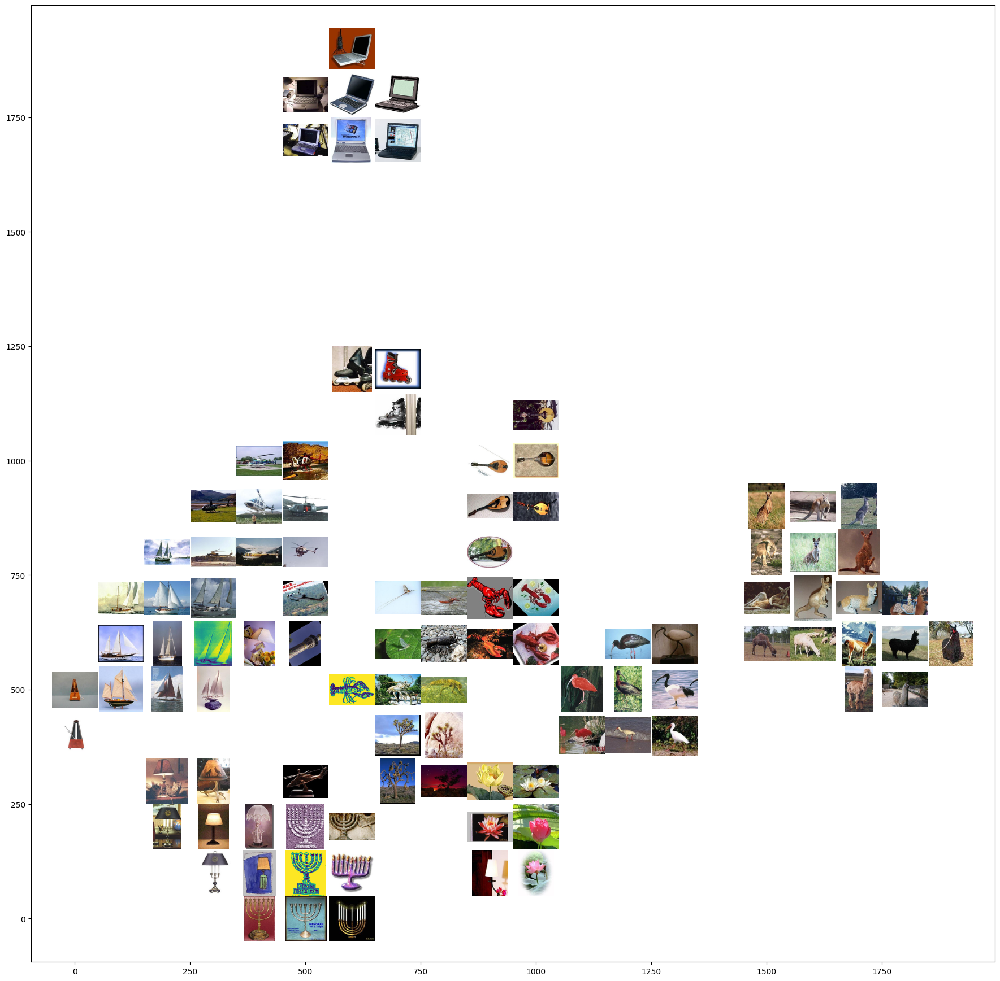

time: 1.7 s (started: 2023-02-21 23:29:35 +08:00)


In [20]:
tsne_to_grid_plotter_manual(tsne_results[:, 0], tsne_results[:, 1],
                            selected_filenames)

## TSNE with PCA

- To reduce dimensions to speed up indexing and search
- After reducing 2048 to 100 dimensions, nearest neighbors are still generally correct

In [21]:
num_feature_dimensions = 100
pca = PCA(n_components=num_feature_dimensions)
pca.fit(feature_list)
feature_list_compressed = pca.transform(feature_list)

PCA(n_components=100)

time: 776 ms (started: 2023-02-21 23:29:37 +08:00)


In [22]:
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='brute',
                             metric='euclidean').fit(feature_list_compressed)
distances, indices = neighbors.kneighbors([feature_list_compressed[0]])

time: 168 ms (started: 2023-02-21 23:29:38 +08:00)


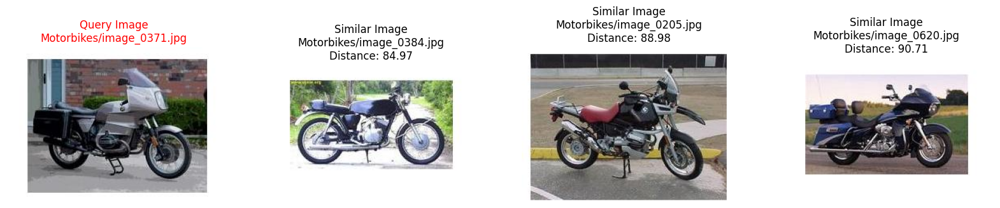

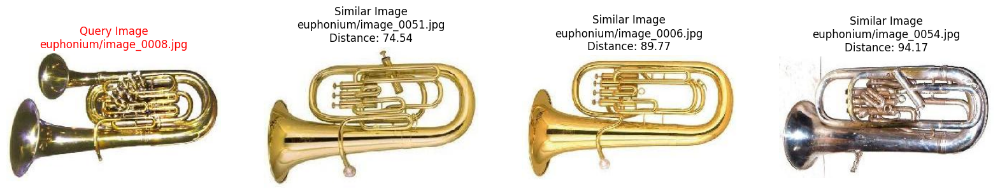

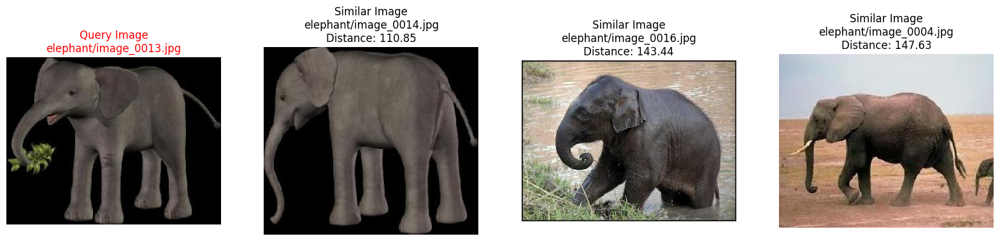

time: 2.21 s (started: 2023-02-21 23:29:38 +08:00)


In [23]:
for _ in range(3):
    random_image_index = random.randint(0, num_images)
    distances, indices = neighbors.kneighbors(
        [feature_list_compressed[random_image_index]])
    # Don't take the first closest image as it will be the same image
    similar_image_paths = [filenames[random_image_index]] + \
        [filenames[indices[0][i]] for i in range(1, 4)]
    plot_images(similar_image_paths, distances[0])

In [24]:
start, end = 6000,7000
selected_features = feature_list_compressed[start:end]
selected_class_ids = class_ids[start:end]
selected_filenames = filenames[start:end]

time_start = time.time()
tsne_results = TSNE(n_components=2, verbose=1,
                    metric='euclidean').fit_transform(selected_features)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time() - time_start))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.001s...
[t-SNE] Computed neighbors for 1000 samples in 0.029s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 55.184172
[t-SNE] KL divergence after 250 iterations with early exaggeration: 54.125725
[t-SNE] KL divergence after 1000 iterations: 0.573546
t-SNE done! Time elapsed: 2.6053340435028076 seconds
time: 2.61 s (started: 2023-02-21 23:29:41 +08:00)


/var/folders/x1/jvkctbr51vvgvwwpw7m2l_fm0000gn/T/ipykernel_42864/3270203280.py:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image.thumbnail((100, 100), Image.ANTIALIAS)


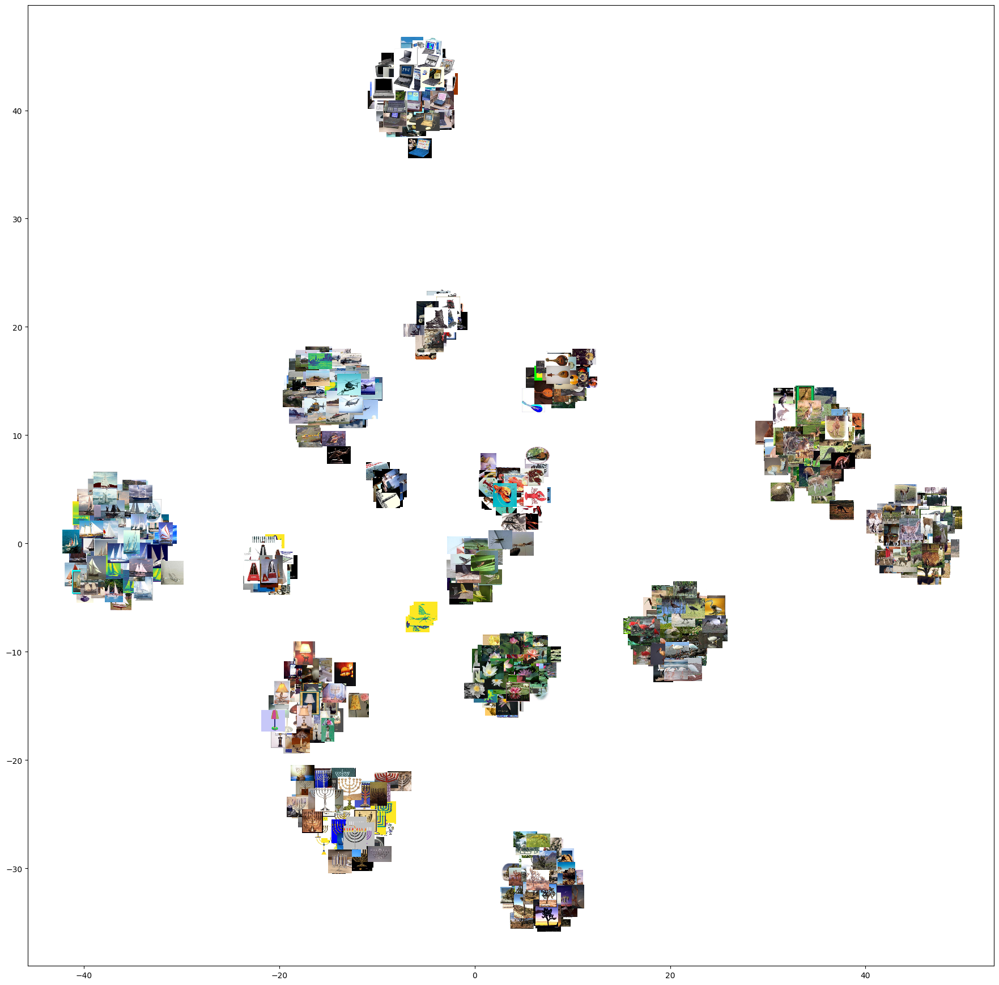

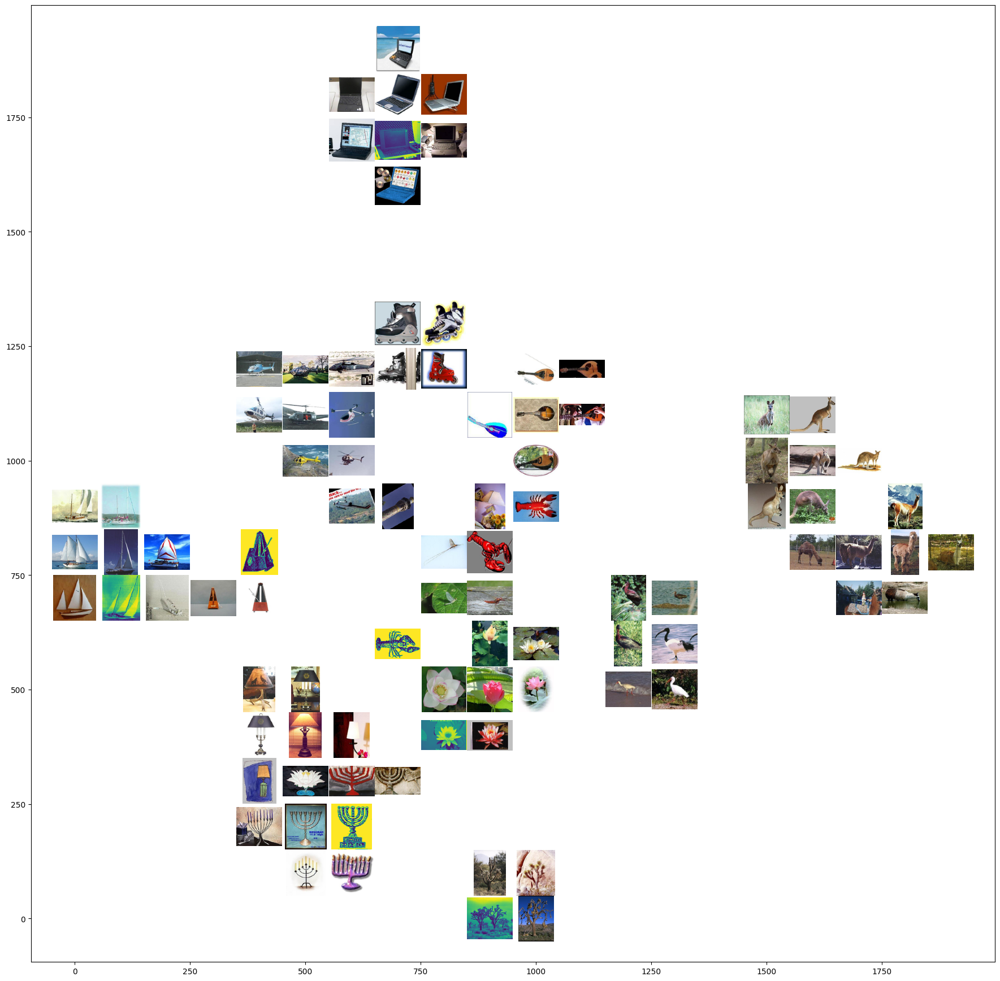

time: 7.9 s (started: 2023-02-21 23:29:43 +08:00)


In [25]:
show_tsne(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)
tsne_to_grid_plotter_manual(tsne_results[:, 0], tsne_results[:, 1],
                            selected_filenames)

# Timing experiments

- Without PCA
    - Kmeans Brute
    - Kmeans BallTree
    - Annoy

- With PCA
    - Kmeans Brute
    - Kmeans BallTree
    - Annoy

In [26]:
# search a random list of 100 images
random_image_indices = random.sample(range(0, num_images), 100)
random_feature_list = [feature_list[each_index] for each_index in random_image_indices]

time: 881 µs (started: 2023-02-21 23:29:51 +08:00)


## Kmeans Brute

In [27]:
%%timeit 
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='brute',
                             metric='euclidean').fit(feature_list)

8.43 ms ± 731 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)
time: 6.82 s (started: 2023-02-21 23:29:52 +08:00)


In [28]:
%%timeit 
neighbors.kneighbors(random_feature_list)

time: 41.7 ms (started: 2023-02-21 23:29:59 +08:00)



KeyboardInterrupt



## Kmeans BallTree

In [ ]:
%%timeit 
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='ball_tree',
                             metric='euclidean').fit(feature_list)

2.04 s ± 16 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
time: 16.4 s (started: 2023-02-19 20:45:22 +08:00)


In [ ]:
%%timeit 
neighbors.kneighbors(random_feature_list)

123 ms ± 2.39 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
time: 10.2 s (started: 2023-02-19 20:45:39 +08:00)


## Annoy

In [ ]:
from annoy import AnnoyIndex

t = AnnoyIndex(2048)  # Length of item vector that will be indexed
starttime = time.time()
for i in range(num_images):
    feature = feature_list[i]
    t.add_item(i, feature)
endtime = time.time()
print('Indexing Time: ', endtime - starttime)
t.build(20)

/var/folders/x1/jvkctbr51vvgvwwpw7m2l_fm0000gn/T/ipykernel_14820/4204520612.py:3: FutureWarning: The default argument for metric will be removed in future version of Annoy. Please pass metric='angular' explicitly.
  t = AnnoyIndex(2048)  # Length of item vector that will be indexed


Indexing Time:  2.4400970935821533


True

time: 2.64 s (started: 2023-02-19 20:45:49 +08:00)


In [ ]:
%%time
for i in range(0, 100):
    t.get_nns_by_vector(feature_list[random_image_index], 5, include_distances=True)

CPU times: user 162 ms, sys: 3.76 ms, total: 165 ms
Wall time: 187 ms
time: 188 ms (started: 2023-02-19 20:45:52 +08:00)


## Kmeans Brute (PCA)

In [ ]:
%%timeit 
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='brute',
                             metric='euclidean').fit(feature_list_compressed)

681 µs ± 49 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)
time: 5.56 s (started: 2023-02-19 20:45:52 +08:00)


In [ ]:
%%timeit 
neighbors.kneighbors(random_feature_list)

167 ms ± 15.2 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
time: 13.6 s (started: 2023-02-19 20:45:58 +08:00)


## Kmeans BallTree (PCA)

In [ ]:
%%timeit 
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='ball_tree',
                             metric='euclidean').fit(feature_list_compressed)

72.7 ms ± 5.76 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
time: 5.97 s (started: 2023-02-19 20:46:12 +08:00)


In [ ]:
%%timeit 
neighbors.kneighbors(random_feature_list)

218 ms ± 46.2 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
time: 1.84 s (started: 2023-02-19 20:46:18 +08:00)


## Annoy (PCA)

In [ ]:
from annoy import AnnoyIndex

t = AnnoyIndex(100)  # Length of item vector that will be indexed
starttime = time.time()
for i in range(num_images):
    feature = feature_list_compressed[i]
    t.add_item(i, feature)
endtime = time.time()
print('Indexing Time: ', endtime - starttime)
t.build(20)

/var/folders/x1/jvkctbr51vvgvwwpw7m2l_fm0000gn/T/ipykernel_14820/820826380.py:3: FutureWarning: The default argument for metric will be removed in future version of Annoy. Please pass metric='angular' explicitly.
  t = AnnoyIndex(100)  # Length of item vector that will be indexed


Indexing Time:  0.2229161262512207


True

time: 287 ms (started: 2023-02-19 20:46:20 +08:00)


In [ ]:
%%timeit
for i in range(0, 100):
    t.get_nns_by_vector(feature_list_compressed[random_image_index], 5, include_distances=True)

4.69 ms ± 328 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)
time: 4.05 s (started: 2023-02-19 20:46:20 +08:00)


# Timing Result Summary
- Significant reductions in search time when using Annoy at 100 dimensions after PCA

| Algorithm | Number of Features | Index Time(ms) | Search time(ms) (100 images) |
| --- | --- | --- | --- |
| KNN Brute | 2048 | 11 | 174 |
| KNN Ball Tree | 2048 | 2860 | 193 |
| Annoy | 2048 | 3290 | 129 |
| KNN Brute (PCA)| 100 | 0.667 | 163 |
| KNN Ball Tree (PCA)| 100 | 49 | 166 |
| Annoy (PCA)| 100 | 255 | <font color='red'>3</font> |

# Comparing Accuracies
- Fraction of all neighbors from all queries that have true label (based on label, not brute force nearest distance)
- If brute force accuracy is already not 100%, even if approximate neighbors measure 100% against brute force neighbors, results may not practically be useful

In [24]:
class_ids = pickle.load(open('features/class_ids-caltech101.pickle', 'rb'))  # 9144 class ids ranging 0-101

def accuracy(feature_list):
    neighbors = NearestNeighbors(n_neighbors=5,
                                algorithm='brute',
                                metric='euclidean').fit(feature_list)
        
    distances, indices = neighbors.kneighbors(feature_list)

    neighbors_class_ids = class_ids[indices] # using indices to get class ids, neighbors_class_ids.shape is (9144, 5) with values representing class ids ranging 0-101
    class_equalities = np.equal(neighbors_class_ids[:, [0]], neighbors_class_ids[:, 1:5])  # column 0 is class of itself, columns 1 to 4 are neighbors
    print('Accuracy: ', class_equalities.mean())

In [ ]:
accuracy(feature_list)

Accuracy:  0.8505304024496938
time: 5.3 s (started: 2023-02-19 20:46:24 +08:00)


## Checking accuracies from resnet trained from scratch
- Quite alot lower, maybe didn't train network long enough or messed up pre-trained weights

In [ ]:
feature_list_scratch = pickle.load(open('features/features-caltech101-resnetscratch.pickle', 'rb'))
pca = PCA(n_components=num_feature_dimensions)
feature_list_scratch_compressed = pca.fit_transform(feature_list_scratch)

accuracy(feature_list_scratch)
accuracy(feature_list_scratch_compressed)

Accuracy:  0.8262248468941382
Accuracy:  0.8220417760279966
time: 8.49 s (started: 2023-02-19 20:46:30 +08:00)


## Checking accuracies from resnet finetuned
- 10 Epochs may not be long enough, accuracy was only 75%

In [ ]:
feature_list_finetuned = pickle.load(open('features/features-caltech101-resnet-finetuned.pickle', 'rb'))
pca = PCA(n_components=num_feature_dimensions)
feature_list_finetuned_compressed = pca.fit_transform(feature_list_finetuned)

accuracy(feature_list_finetuned)
accuracy(feature_list_finetuned_compressed)

Accuracy:  0.8322123797025371
Accuracy:  0.849983595800525
time: 5.08 s (started: 2023-02-19 20:48:29 +08:00)
